In [18]:
import data.breathe_data as bd
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
import data.helpers as dh
from datetime import timedelta
import o2_fev1_analysis.smooth as smooth
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [50]:
df = bd.load_meas_from_excel("BR_O2_FEV1_FEF2575")

In [3]:
df.head(1)

,ID,Date Recorded,FEV1,O2 Saturation,FEF2575,PEF,PEF (L/s),ecFEV1,ecFEF2575,ecPEF (L/s),Sex,Height,Age,Predicted FEV1,Healthy O2 Saturation,ecFEV1 % Predicted,FEV1 % Predicted,O2 Saturation % Healthy
0,101,2019-01-25,1.31,97.0,0.54,NaN,NaN,1.31,0.67,NaN,Male,173.0,53,3.610061,97.150104,36.287474,36.287474,99.845492


In [5]:
df_for_ID = df[df.ID == '101']

def count_records_per_day(df_for_ID):
    cols = ['FEV1', 'O2 Saturation', 'FEF2575', 'PEF']

    start_date = df_for_ID['Date Recorded'].min()

    # Create Day column and put current date - start_date into it
    df_for_ID['Day'] = (df_for_ID['Date Recorded'] - start_date).apply(lambda x: x.days)

    # Count number of measurements per day
    df_count = df_for_ID.groupby('Day')[cols].count()

    # Sum count on axis 0
    return df_count.sum(axis=1).reset_index().rename(columns={0: 'n_measurements'})

In [6]:
df_data = df.groupby("ID").apply(count_records_per_day).reset_index().drop(columns=['level_1'])

In [7]:
df_data

,ID,Day,n_measurements
0,101,0,3
1,101,1,3
2,101,2,3
3,101,3,3
4,101,4,3
...,...,...,...
60780,553,172,4
60781,553,198,4
60782,553,199,1
60783,553,200,4


In [21]:
# Calculate total measurements per ID
id_totals = df_data.groupby('ID')['n_measurements'].sum().sort_values(ascending=False)

df_heatmap = df_data.pivot(index='ID', columns='Day', values='n_measurements')
df_heatmap = df_heatmap.reindex(id_totals.index)  # Reorder rows based on total measurements

# Replace NaN with 0
df_heatmap = df_heatmap.fillna(0)

fig = px.imshow(df_heatmap, color_continuous_scale=['black', 'red', 'orange', 'yellow', 'lightgreen'])
fig.update_traces(
    colorbar=dict(title='Number of Measurements')
)
fig.update_yaxes(showticklabels=False, title=f"Participants (n = {df_data.ID.nunique()})")
fig.update_layout(width=600, height=500)

fig.show()

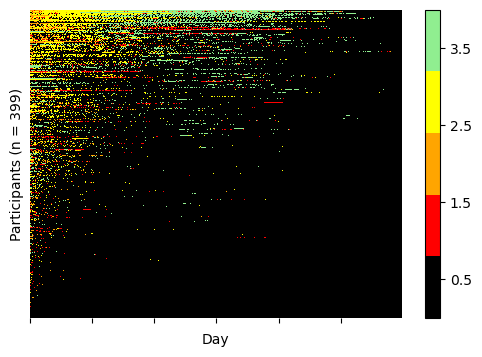

In [ ]:
# Calculate total measurements per ID
id_totals = df_data.groupby('ID')['n_measurements'].sum().sort_values(ascending=False)

df_heatmap = df_data.pivot(index='ID', columns='Day', values='n_measurements')
df_heatmap = df_heatmap.reindex(id_totals.index)  # Reorder rows based on total measurements

# Replace NaN with 0
df_heatmap = df_heatmap.fillna(0)

# Create figure with seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(
    df_heatmap,
    cmap=sns.color_palette(['black', 'red', 'orange', 'yellow', 'lightgreen']),
    cbar=False  # Hide the initial colorbar
)
# Hide y-axis labels
plt.yticks([])
plt.ylabel(f"Participants (n = {df_data.ID.nunique()})")
plt.xlabel("Day")
# days in years on x axis
plt.xticks(list(range(0, 1800, 300)))
# Reduce height and width
plt.gcf().set_size_inches(6, 4)
# Get the heatmap mappable and create colorbar with custom ticks
cbar = plt.colorbar(plt.gca().collections[0], ticks=[0.5, 1.5, 2.5, 3.5, 4.5])

plt.show()

# Data demographics

In [52]:
df = bd.load_meas_from_excel("BR_O2_FEV1_FEF2575_conservative_smoothing_with_idx")

In [70]:
ppfev1 = df.groupby('ID').apply(lambda df: df['ecFEV1 % Predicted'].mean())
n_id_sup_90 = len(ppfev1[ppfev1 >= 90])
prct_id_sup_90 = n_id_sup_90 / len(ppfev1) * 100
n_id_70_90 = len(ppfev1[(ppfev1 >= 70) & (ppfev1 < 90)])
prct_id_70_90 = n_id_70_90 / len(ppfev1) *100
n_id_40_70 = len(ppfev1[(ppfev1 >= 40) & (ppfev1 < 70)])
prct_id_40_70 = n_id_40_70 / len(ppfev1) * 100
n_id_inf_40 = len(ppfev1[ppfev1 < 40])
prct_id_inf_40 = n_id_inf_40 / len(ppfev1)* 100

# Print
print(f">=90%: {n_id_sup_90} ({prct_id_sup_90:.0f}%)")
print(f"70-89%: {n_id_70_90} ({prct_id_70_90:.0f}%)")
print(f"40-69%: {n_id_40_70} ({prct_id_40_70:.0f}%)")
print(f"<40%: {n_id_inf_40} ({prct_id_inf_40:.0f}%)")


>=90%: 55 (16%)
70-89%: 107 (30%)
40-69%: 151 (43%)
<40%: 39 (11%)


In [132]:
ids = df.ID.unique()

In [133]:
df_pat = pd.read_csv(
        f"{dh.get_path_to_main()}DataFiles/BR/REDCapData/ProcessedData/brPatient_20240703.csv",
        # usecols="A, E, G, H, Y"
        # usecols=[0, 6, 7, 24],
        dtype={"ID": str},
    )
df_pat = df_pat.set_index('ID').loc[ids].reset_index()
print(df_pat.columns)
df_pat.head(1)

Index(['ID', 'REDCapID', 'PatClinDate', 'StudyDate', 'DOB', 'Age', 'Sex',
       'Height', 'Weight', 'PredictedFEV1', 'CFGene1', 'CFGene2',
       'GeneralComments', 'ConsentStatus', 'ConsentDate', 'WithdrawalDate',
       'WithdrawalComments', 'PartitionKey', 'Hospital', 'StudyNumber',
       'Prior6Mnth', 'Post6Mnth', 'StudyEmail', 'CalcAgeExact', 'CalcAge'],
      dtype='object')


,ID,REDCapID,PatClinDate,StudyDate,DOB,Age,Sex,Height,Weight,PredictedFEV1,...,WithdrawalDate,WithdrawalComments,PartitionKey,Hospital,StudyNumber,Prior6Mnth,Post6Mnth,StudyEmail,CalcAgeExact,CalcAge
0,101,101,2023-10-09,2019-02-20,1965-11-08,53.0,Male,173.0,66.0,3.59,...,NaN,NaN,bf306cf3-e0e3-4293-ae15-c4e8c2f85e34,PAP,projectb861@gmail.com,2018-08-20,2019-08-20,projectb861@gmail.com,53.282854,53


In [134]:
df_pat['BMI'] = df_pat['Weight'] / (df_pat['Height'] / 100)**2
print(f"Mean BMI: {df_pat['BMI'].mean():.1f} ± {df_pat['BMI'].std():.1f}")
print(f"Mean Age: {df_pat['CalcAge'].mean():.1f} ± {df_pat['CalcAge'].std():.1f}")
n_female = (df_pat['Sex'] == 'Female').sum()
print(f"Female: {n_female} ({n_female/len(df_pat)*100:.1f}%)")

Mean BMI: 23.9 ± 3.6
Mean Age: 32.6 ± 11.1
Female: 183 (52.0%)


In [135]:
df_pat.ID.nunique()

352

In [72]:
df_pat.columns

Index(['ID', 'REDCapID', 'PatClinDate', 'StudyDate', 'DOB', 'Age', 'Sex',
       'Height', 'Weight', 'PredictedFEV1', 'CFGene1', 'CFGene2',
       'GeneralComments', 'ConsentStatus', 'ConsentDate', 'WithdrawalDate',
       'WithdrawalComments', 'PartitionKey', 'Hospital', 'StudyNumber',
       'Prior6Mnth', 'Post6Mnth', 'StudyEmail', 'CalcAgeExact', 'Age', 'BMI'],
      dtype='object')

In [137]:
# Count number of times where CFGene1 and CFGene2 are both equal and equalt to 1
# DRop na in CFGene1 or CFGene2
df_gene = df_pat.dropna(subset=['CFGene1', 'CFGene2'])

n_homo_d508 = ((df_gene['CFGene1'] == 1) & (df_gene['CFGene2'] == 1)).sum()
n_hetero_d508 = ((df_gene['CFGene1'] == 1) & (df_gene['CFGene2'] != 1)).sum()
n_other = ((df_gene['CFGene1'] != 1) & (df_gene['CFGene2'] != 1)).sum() + 2

print(f"Homo D508: {n_homo_d508} ({np.round(n_homo_d508 / len(df_gene) * 100, 1)}%)")
print(f"Hetero D508: {n_hetero_d508} ({np.round(n_hetero_d508 / len(df_gene) * 100, 1)}%)")
print(f"other: {n_other} ({np.round(n_other / len(df_gene) * 100, 1)}%)")

print(len(df_gene))


Homo D508: 162 (46.3%)
Hetero D508: 157 (44.9%)
other: 32 (9.1%)
350


In [138]:
df_drug = bd.add_drug_therapy_to_df(df)

ERROR:root:ID 175 - ?? Symkevi start date is wrong, removing it because no clue about the true date (maybe 2019?)
ERROR:root:ID 206 - Updating Ivacaftor stop date to not overlap and changing Ivacaftor + Symkevi to Trikafta


In [139]:
# Count number of patients prescribed each CFTR modulator
cftr_modulators = df_drug.DrugTherapyType.unique()

def has_drug_therapy(df, cftr_mod):
    drug_therapies = df.DrugTherapyType.unique()
    # Return True if cftr_mod is in drug_therapies
    return cftr_mod in drug_therapi

for cftr_mod in cftr_modulators:
    mask = df.groupby('ID').apply(lambda df: cftr_mod in df.DrugTherapyType.unique())
    n_mod = mask.sum()
    prct_mod = n_mod / df.ID.nunique() * 100
    print(f"{cftr_mod}: {n_mod} ({prct_mod:.0f}%)")

None: 127 (36%)
Symkevi: 88 (25%)
Trikafta: 286 (81%)
Ivacaftor: 23 (7%)
Orkambi: 4 (1%)
Unknown: 2 (1%)


In [117]:
a = 'a'
bc = ['b', 'c']
a in bc

False